# 09 - Consecutive Pair Batches (SuperPoint + LightGlue + MAGSAC)

Goal in this notebook:
- **Only consecutive train pairs** are used: `(id, id+1)` (e.g. `(1,2), (2,3), ...`)
- For each pair:
  - first frame = **anchor** (known GT on `map.png`)
  - second frame = **validation target** (localized from map tile, GT used only for evaluation)
- Preprocessing with optional filters:
  - resize to fixed max side
  - optional gray filter
  - optional shadow filter
  - optional edge filter
- Two-stage localization:
  1. anchor image to local map crop (estimate scale/rotation via feature matching)
  2. validation image to larger map tile around anchor (`n * anchor image`, default `n=3`)
- Matching backend: **SuperPoint + LightGlue**, outlier handling with **MAGSAC homography**
- Visual diagnostics:
  - pairwise feature matches (validation image vs map tile)
  - global map overlay (anchor GT, val GT, val predictions)


## Evaluation Metric (same style as previous notebooks)

For each validation frame:
`d = sqrt((x_pred - x_gt)^2 + (y_pred - y_gt)^2)`

Score:
`100 * mean(acc@25px, acc@125px, acc@500px)`


In [1]:
from dataclasses import dataclass
from pathlib import Path
from time import perf_counter
from typing import Dict, List, Optional, Tuple

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch


In [2]:
# Dependency check for SuperPoint + LightGlue
try:
    from lightglue import LightGlue, SuperPoint
    from lightglue.utils import rbd
except Exception as e:
    raise ImportError(
        'This notebook requires LightGlue+SuperPoint. Install with: pip install lightglue'
    ) from e

# Paths (robust for running from project root or notebooks/)
CANDIDATE_ROOTS = [Path.cwd(), Path.cwd().parent, Path('.'), Path('..')]
PROJECT_ROOT = None
_seen_roots = set()
for cand in CANDIDATE_ROOTS:
    try:
        root = cand.resolve()
    except Exception:
        continue
    key = str(root)
    if key in _seen_roots:
        continue
    _seen_roots.add(key)
    if (root / 'data' / 'data').exists():
        PROJECT_ROOT = root
        break
if PROJECT_ROOT is None:
    raise FileNotFoundError('Could not find project root containing data/data.')

DATA_ROOT = PROJECT_ROOT / 'data' / 'data'
TRAIN_IMG_DIR = DATA_ROOT / 'train_data' / 'train_images'
TRAIN_POS_CSV = DATA_ROOT / 'train_data' / 'train_pos.csv'
TRAIN_CAM_CSV = DATA_ROOT / 'train_data' / 'train_cam.csv'
MAP_PATH = DATA_ROOT / 'map.png'

# Runtime / image scaling
IMAGE_MAX_SIDE = 1280  # good default for speed/quality tradeoff

# Optional preprocessing filters
ENABLE_GRAY_FILTER = True
ENABLE_SHADOW_FILTER = False
ENABLE_EDGE_FILTER = True

CLAHE_CLIP_LIMIT = 2.5
CLAHE_GRID = (8, 8)
EDGE_CANNY_LOW = 50
EDGE_CANNY_HIGH = 150
EDGE_DILATE_KERNEL = 3
EDGE_BLEND_GRAY = 0.70
EDGE_BLEND_EDGE = 0.30

# Pairwise tile strategy (constant map crop size)
CONST_MAP_CROP_BASE_PX = 900
CONST_MAP_CROP_SCALE = 1.0
CONST_MAP_CROP_MIN_PX = 192
CONST_MAP_CROP_MAX_PX = 1400

ANCHOR_INIT_SCALE_HINT = 0.18        # fallback map-scale for anchor/query images
ANCHOR_CALIB_TILE_FACTOR = 2.6       # local crop factor for anchor->map calibration
ANCHOR_CALIB_MIN_PX = 256

# Matching / geometry
MATCH_MIN_CONF = 0.05
MAGSAC_REPROJ_THR = 4.0
MAX_NUM_KEYPOINTS = 4096
MIN_INLIERS_ANCHOR = 6
MIN_INLIERS_VAL = 6

# Geometric priors from anchor calibration
SCALE_HINT_MIN = 0.06
SCALE_HINT_MAX = 1.20
ROT_HINT_ABS_MAX_DEG = 60.0

# Matching search (scale/rotation sweeps for robustness)
SWEEP_SCALES_ANCHOR = [0.12, 0.16, 0.20, 0.26, 0.34]
SWEEP_ROTS_ANCHOR = [-20.0, -10.0, 0.0, 10.0, 20.0]
SWEEP_SCALES_VAL_MUL = [0.80, 1.00, 1.25]
SWEEP_ROTS_VAL_DELTA = [-10.0, 0.0, 10.0]

# Optional one-axis constraint around anchor (rough homography assumption)
ENABLE_AXIS_CONSTRAINT = True
AXIS_MIN_INLIERS = 8

# Debug/plots
DEBUG_MATCH_PLOTS = 8
DEBUG_MAX_DRAW_LINES = 250

# Load data
train_pos_df = pd.read_csv(TRAIN_POS_CSV)
train_cam_df = pd.read_csv(TRAIN_CAM_CSV)
train_df = train_cam_df.merge(train_pos_df, on='id', how='inner').copy()
train_df['id'] = train_df['id'].astype(int)
train_df = train_df.sort_values('id').reset_index(drop=True)

map_bgr = cv2.imread(str(MAP_PATH), cv2.IMREAD_COLOR)
if map_bgr is None:
    raise FileNotFoundError(f'Map not found: {MAP_PATH}')
map_rgb = cv2.cvtColor(map_bgr, cv2.COLOR_BGR2RGB)
MAP_H, MAP_W = map_rgb.shape[:2]

print('project_root:', PROJECT_ROOT)
print('train frames:', len(train_df))
print('map size:', (MAP_W, MAP_H))




project_root: /home/rupert/projects/gnss-denied-localization
train frames: 305
map size: (5000, 2500)


In [3]:
# Build consecutive (id, id+1) batches
pairs = []
for i in range(len(train_df) - 1):
    r0 = train_df.iloc[i]
    r1 = train_df.iloc[i + 1]

    id0 = int(r0['id'])
    id1 = int(r1['id'])

    # Keep only strictly consecutive IDs
    if id1 != id0 + 1:
        continue

    pairs.append({
        'pair_idx': int(len(pairs)),
        'anchor_id': id0,
        'val_id': id1,
        'anchor_x': float(r0['x_pixel']),
        'anchor_y': float(r0['y_pixel']),
        'val_gt_x': float(r1['x_pixel']),
        'val_gt_y': float(r1['y_pixel']),
    })

pair_df = pd.DataFrame(pairs)

print('consecutive pairs:', len(pair_df))
if len(pair_df) == 0:
    raise RuntimeError('No consecutive pairs found. Check dataset IDs.')

display(pair_df.head(20))


consecutive pairs: 296


,pair_idx,anchor_id,val_id,anchor_x,anchor_y,val_gt_x,val_gt_y
0,0,13,14,2572.737997,286.932310,2584.838216,569.575778
1,1,14,15,2584.838216,569.575778,2596.241078,852.752558
2,2,15,16,2596.241078,852.752558,2606.549987,1134.367249
3,3,16,17,2606.549987,1134.367249,2616.776583,1416.000406
4,4,17,18,2616.776583,1416.000406,2628.009666,1698.616847
5,5,18,19,2628.009666,1698.616847,2310.170891,1888.884916
6,6,19,20,2310.170891,1888.884916,2300.893728,1596.091679
7,7,20,21,2300.893728,1596.091679,2289.151019,1314.752983
8,8,21,22,2289.151019,1314.752983,2278.064229,1032.964801
9,9,22,23,2278.064229,1032.964801,2267.377316,751.323745


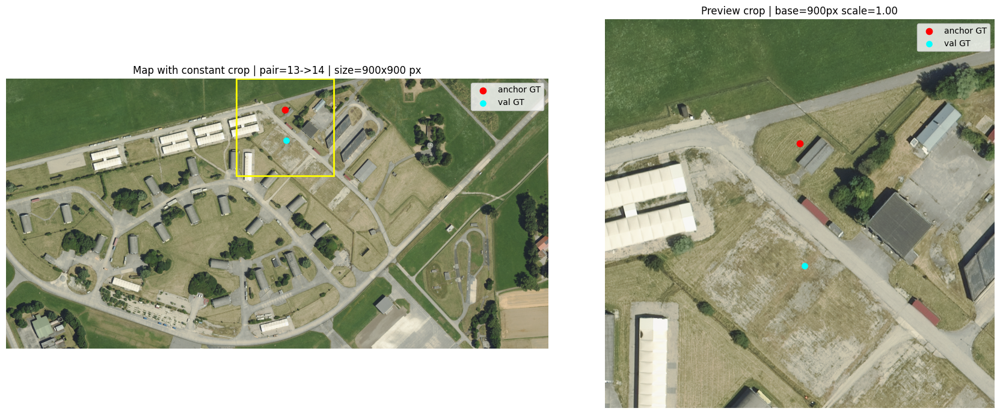

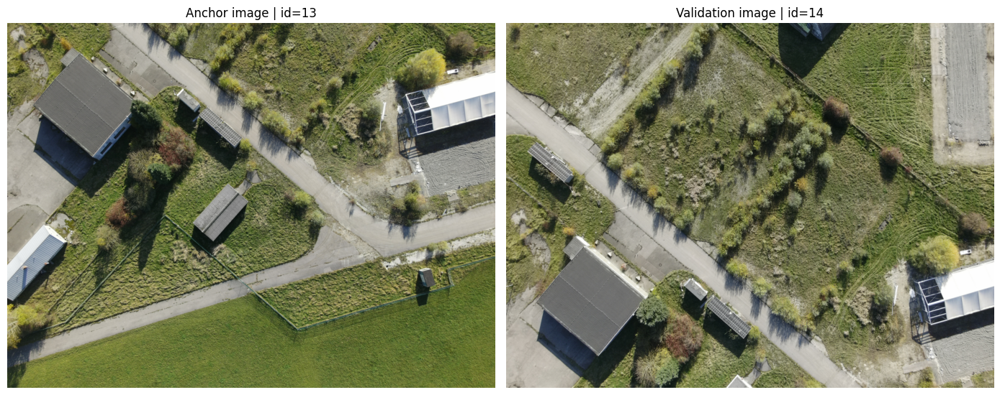

anchor image: 0013.JPG
val image   : 0014.JPG


In [8]:
# Preview: constant map crop size around anchor GT (adjust CONST_MAP_CROP_SCALE and rerun)
PAIR_ANCHOR_ID = 13
PAIR_VAL_ID = 14
PREVIEW_PAIR_INDEX = 0  # fallback if pair 13->14 is not found

# Select pair (prefer explicit ids 13->14)
sel = pair_df[
    (pair_df["anchor_id"].astype(int) == int(PAIR_ANCHOR_ID)) &
    (pair_df["val_id"].astype(int) == int(PAIR_VAL_ID))
]
if len(sel) == 0:
    preview_idx = int(np.clip(PREVIEW_PAIR_INDEX, 0, len(pair_df) - 1))
    pr = pair_df.iloc[preview_idx]
    print(f"Pair {PAIR_ANCHOR_ID}->{PAIR_VAL_ID} not found, using pair index {preview_idx}.")
else:
    pr = sel.iloc[0]

anchor_xy = (float(pr["anchor_x"]), float(pr["anchor_y"]))
val_xy = (float(pr["val_gt_x"]), float(pr["val_gt_y"]))

preview_tile_size = int(np.clip(
    round(float(CONST_MAP_CROP_BASE_PX) * float(CONST_MAP_CROP_SCALE)),
    int(CONST_MAP_CROP_MIN_PX),
    min(MAP_W, MAP_H, int(CONST_MAP_CROP_MAX_PX)),
))

x0 = int(np.clip(round(anchor_xy[0] - preview_tile_size / 2.0), 0, max(0, MAP_W - preview_tile_size)))
y0 = int(np.clip(round(anchor_xy[1] - preview_tile_size / 2.0), 0, max(0, MAP_H - preview_tile_size)))
x1 = min(MAP_W, x0 + preview_tile_size)
y1 = min(MAP_H, y0 + preview_tile_size)
preview_crop = map_rgb[y0:y1, x0:x1]

# --- Plot map + crop ---
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

axes[0].imshow(map_rgb)
rect = plt.Rectangle((x0, y0), x1 - x0, y1 - y0, fill=False, edgecolor="yellow", linewidth=2.0)
axes[0].add_patch(rect)
axes[0].scatter([anchor_xy[0]], [anchor_xy[1]], s=55, c="red", label="anchor GT")
axes[0].scatter([val_xy[0]], [val_xy[1]], s=45, c="cyan", label="val GT")
axes[0].set_title(
    f"Map with constant crop | pair={int(pr['anchor_id'])}->{int(pr['val_id'])} | "
    f"size={x1-x0}x{y1-y0} px"
)
axes[0].legend(loc="upper right")
axes[0].axis("off")

axes[1].imshow(preview_crop)
ax_local = anchor_xy[0] - x0
ay_local = anchor_xy[1] - y0
vx_local = val_xy[0] - x0
vy_local = val_xy[1] - y0
axes[1].scatter([ax_local], [ay_local], s=55, c="red", label="anchor GT")
axes[1].scatter([vx_local], [vy_local], s=45, c="cyan", label="val GT")
axes[1].set_title(
    f"Preview crop | base={CONST_MAP_CROP_BASE_PX}px scale={CONST_MAP_CROP_SCALE:.2f}"
)
axes[1].legend(loc="upper right")
axes[1].axis("off")

plt.tight_layout()
plt.show()


# --- Also plot the two pair images (anchor + val) ---
def _resolve_train_image_path(image_id: int) -> Path:
    stems = [f"{int(image_id):04d}", str(int(image_id))]
    exts = [".JPG", ".jpg", ".jpeg", ".JPEG", ".png", ".PNG"]
    for st in stems:
        for ext in exts:
            p = TRAIN_IMG_DIR / f"{st}{ext}"
            if p.exists():
                return p
    raise FileNotFoundError(f"Image not found for id={image_id} in {TRAIN_IMG_DIR}")

def _load_preview_rgb(image_id: int, max_side: Optional[int] = IMAGE_MAX_SIDE):
    p = _resolve_train_image_path(int(image_id))
    bgr = cv2.imread(str(p), cv2.IMREAD_COLOR)
    if bgr is None:
        raise RuntimeError(f"Cannot read image: {p}")
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    if max_side is not None:
        h, w = rgb.shape[:2]
        m = max(h, w)
        if m > int(max_side):
            s = float(max_side) / float(m)
            nw = max(32, int(round(w * s)))
            nh = max(32, int(round(h * s)))
            rgb = cv2.resize(rgb, (nw, nh), interpolation=cv2.INTER_AREA)
    return rgb, p

anchor_rgb, anchor_path = _load_preview_rgb(int(pr["anchor_id"]))
val_rgb, val_path = _load_preview_rgb(int(pr["val_id"]))

fig, ax = plt.subplots(1, 2, figsize=(14, 6))
ax[0].imshow(anchor_rgb)
ax[0].set_title(f"Anchor image | id={int(pr['anchor_id'])}")
ax[0].axis("off")

ax[1].imshow(val_rgb)
ax[1].set_title(f"Validation image | id={int(pr['val_id'])}")
ax[1].axis("off")

plt.tight_layout()
plt.show()

print("anchor image:", anchor_path.name)
print("val image   :", val_path.name)


In [7]:
# Utilities: image loading, preprocessing, geometry helpers
_IMAGE_CACHE: Dict[Tuple[int, Optional[int]], np.ndarray] = {}
_PROC_CACHE: Dict[Tuple[int, Optional[int], bool, bool, bool, int, int, int], np.ndarray] = {}


def resolve_train_image_path(image_id: int) -> Path:
    stems = [f'{int(image_id):04d}', str(int(image_id))]
    exts = ['.JPG', '.jpg', '.jpeg', '.JPEG', '.png', '.PNG']
    for st in stems:
        for ext in exts:
            p = TRAIN_IMG_DIR / f'{st}{ext}'
            if p.exists():
                return p
    raise FileNotFoundError(f'Image not found for id={image_id} in {TRAIN_IMG_DIR}')


def resize_keep_aspect(img_rgb: np.ndarray, max_side: Optional[int]) -> np.ndarray:
    if max_side is None:
        return img_rgb
    h, w = img_rgb.shape[:2]
    m = max(h, w)
    if m <= int(max_side):
        return img_rgb
    s = float(max_side) / float(m)
    nw = max(32, int(round(w * s)))
    nh = max(32, int(round(h * s)))
    return cv2.resize(img_rgb, (nw, nh), interpolation=cv2.INTER_AREA)


def load_train_image_cached(image_id: int, max_side: Optional[int]) -> np.ndarray:
    key = (int(image_id), max_side)
    if key in _IMAGE_CACHE:
        return _IMAGE_CACHE[key]

    p = resolve_train_image_path(int(image_id))
    bgr = cv2.imread(str(p), cv2.IMREAD_COLOR)
    if bgr is None:
        raise RuntimeError(f'Cannot read image: {p}')
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    rgb = resize_keep_aspect(rgb, max_side=max_side)
    _IMAGE_CACHE[key] = rgb
    return rgb


def apply_shadow_filter_rgb(img_rgb: np.ndarray, clip_limit: float = 2.5, grid: Tuple[int, int] = (8, 8)) -> np.ndarray:
    lab = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=float(clip_limit), tileGridSize=tuple(grid))
    l2 = clahe.apply(l)
    out = cv2.cvtColor(cv2.merge([l2, a, b]), cv2.COLOR_LAB2RGB)
    return out


def to_gray_rgb(img_rgb: np.ndarray) -> np.ndarray:
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    return cv2.cvtColor(gray, cv2.COLOR_GRAY2RGB)


def preprocess_for_matching(
    img_rgb: np.ndarray,
    enable_gray: bool,
    enable_shadow: bool,
    enable_edge: bool,
    canny_low: int,
    canny_high: int,
) -> np.ndarray:
    proc = img_rgb

    if bool(enable_shadow):
        proc = apply_shadow_filter_rgb(proc, clip_limit=CLAHE_CLIP_LIMIT, grid=CLAHE_GRID)

    if bool(enable_gray):
        proc = to_gray_rgb(proc)

    if not bool(enable_edge):
        return proc

    gray = cv2.cvtColor(proc, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(gray, int(canny_low), int(canny_high))
    k = int(max(1, EDGE_DILATE_KERNEL))
    if k > 1:
        kernel = np.ones((k, k), dtype=np.uint8)
        edges = cv2.dilate(edges, kernel, iterations=1)

    mix = cv2.addWeighted(gray, float(EDGE_BLEND_GRAY), edges, float(EDGE_BLEND_EDGE), 0.0)
    return cv2.cvtColor(mix, cv2.COLOR_GRAY2RGB)


def get_match_image(image_id: int) -> np.ndarray:
    key = (
        int(image_id),
        IMAGE_MAX_SIDE,
        bool(ENABLE_GRAY_FILTER),
        bool(ENABLE_SHADOW_FILTER),
        bool(ENABLE_EDGE_FILTER),
        int(EDGE_CANNY_LOW),
        int(EDGE_CANNY_HIGH),
        int(EDGE_DILATE_KERNEL),
    )
    if key in _PROC_CACHE:
        return _PROC_CACHE[key]

    rgb = load_train_image_cached(int(image_id), max_side=IMAGE_MAX_SIDE)
    proc = preprocess_for_matching(
        rgb,
        enable_gray=ENABLE_GRAY_FILTER,
        enable_shadow=ENABLE_SHADOW_FILTER,
        enable_edge=ENABLE_EDGE_FILTER,
        canny_low=EDGE_CANNY_LOW,
        canny_high=EDGE_CANNY_HIGH,
    )
    _PROC_CACHE[key] = proc
    return proc


def resize_rgb(img: np.ndarray, scale: float) -> np.ndarray:
    h, w = img.shape[:2]
    nw = max(8, int(round(w * float(scale))))
    nh = max(8, int(round(h * float(scale))))
    return cv2.resize(img, (nw, nh), interpolation=cv2.INTER_AREA)


def rotate_rgb_keep_size(img: np.ndarray, angle_deg: float) -> np.ndarray:
    h, w = img.shape[:2]
    M = cv2.getRotationMatrix2D((w / 2.0, h / 2.0), float(angle_deg), 1.0)
    rot = cv2.warpAffine(
        img,
        M,
        (w, h),
        flags=cv2.INTER_LINEAR,
        borderMode=cv2.BORDER_CONSTANT,
        borderValue=(0, 0, 0),
    )
    return rot


def make_centered_canvas(img: np.ndarray, out_w: int, out_h: int) -> Tuple[np.ndarray, Tuple[int, int], Tuple[int, int]]:
    out_w = int(max(8, out_w))
    out_h = int(max(8, out_h))

    work = img
    ih, iw = work.shape[:2]
    if ih > out_h or iw > out_w:
        sf = min(float(out_w) / max(1, iw), float(out_h) / max(1, ih))
        sf = max(1e-3, sf)
        work = resize_rgb(work, sf)
        ih, iw = work.shape[:2]

    canvas = np.zeros((out_h, out_w, 3), dtype=work.dtype)
    x0 = (out_w - iw) // 2
    y0 = (out_h - ih) // 2
    canvas[y0:y0 + ih, x0:x0 + iw] = work
    return canvas, (int(x0), int(y0)), (int(iw), int(ih))


def extract_crop_by_size(map_img: np.ndarray, center_xy: Tuple[float, float], crop_w: int, crop_h: int) -> Tuple[np.ndarray, int, int]:
    cw = int(max(16, crop_w))
    ch = int(max(16, crop_h))

    cx, cy = float(center_xy[0]), float(center_xy[1])
    x0 = int(round(cx - cw / 2.0))
    y0 = int(round(cy - ch / 2.0))
    x0 = int(np.clip(x0, 0, max(0, map_img.shape[1] - cw)))
    y0 = int(np.clip(y0, 0, max(0, map_img.shape[0] - ch)))

    x1 = min(map_img.shape[1], x0 + cw)
    y1 = min(map_img.shape[0], y0 + ch)
    crop = map_img[y0:y1, x0:x1]
    return crop, x0, y0


def project_point_homography(H: np.ndarray, xy: Tuple[float, float]) -> Tuple[float, float]:
    p = np.array([float(xy[0]), float(xy[1]), 1.0], dtype=np.float64)
    q = H @ p
    if abs(float(q[2])) < 1e-12:
        return np.nan, np.nan
    return float(q[0] / q[2]), float(q[1] / q[2])


def eval_metric_from_df(df: pd.DataFrame) -> Dict[str, float]:
    if len(df) == 0:
        return {
            'n': 0.0,
            'mean_err_px': np.nan,
            'median_err_px': np.nan,
            'acc_25': np.nan,
            'acc_125': np.nan,
            'acc_500': np.nan,
            'score': np.nan,
        }

    d = np.sqrt((df['pred_x'] - df['gt_x']) ** 2 + (df['pred_y'] - df['gt_y']) ** 2)
    a25 = float((d <= 25.0).mean())
    a125 = float((d <= 125.0).mean())
    a500 = float((d <= 500.0).mean())
    score = 100.0 * float(np.mean([a25, a125, a500]))

    return {
        'n': float(len(df)),
        'mean_err_px': float(d.mean()),
        'median_err_px': float(d.median()),
        'acc_25': a25,
        'acc_125': a125,
        'acc_500': a500,
        'score': score,
    }


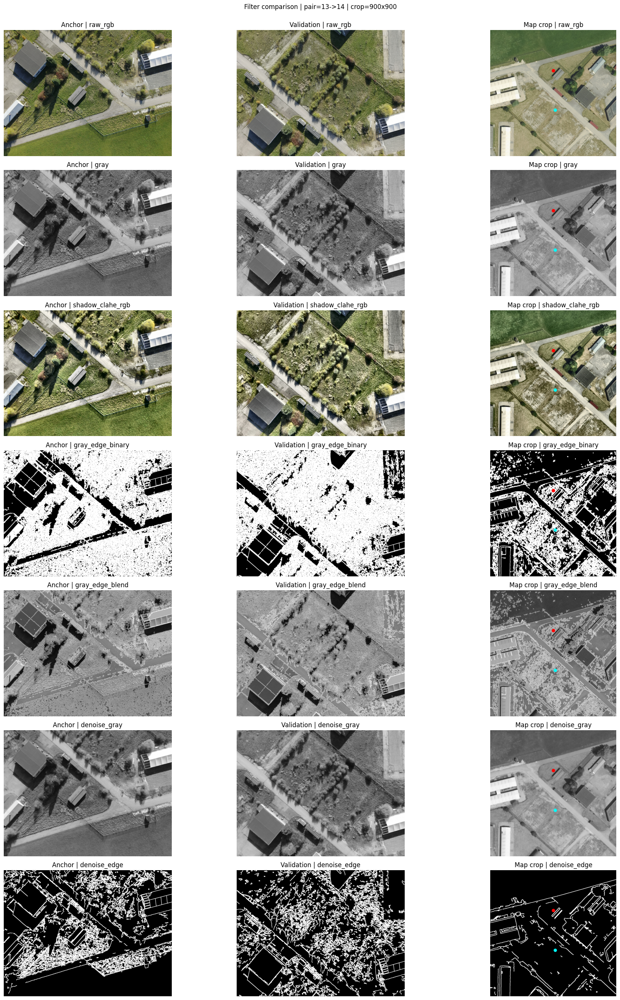

In [11]:
# Compare filter variants on anchor/val/map-crop (pair 13->14 by default)

PAIR_ANCHOR_ID = 13
PAIR_VAL_ID = 14
PREVIEW_PAIR_INDEX = 0  # fallback if pair not found

# Tune here
EDGE_LOW = EDGE_CANNY_LOW
EDGE_HIGH = EDGE_CANNY_HIGH
EDGE_DILATE = EDGE_DILATE_KERNEL

# Select pair
sel = pair_df[
    (pair_df["anchor_id"].astype(int) == int(PAIR_ANCHOR_ID)) &
    (pair_df["val_id"].astype(int) == int(PAIR_VAL_ID))
]
if len(sel) == 0:
    idx = int(np.clip(PREVIEW_PAIR_INDEX, 0, len(pair_df) - 1))
    pr = pair_df.iloc[idx]
    print(f"Pair {PAIR_ANCHOR_ID}->{PAIR_VAL_ID} not found, using pair index {idx}.")
else:
    pr = sel.iloc[0]

anchor_xy = (float(pr["anchor_x"]), float(pr["anchor_y"]))
val_xy = (float(pr["val_gt_x"]), float(pr["val_gt_y"]))

# Load images
anchor_rgb = load_train_image_cached(int(pr["anchor_id"]), max_side=IMAGE_MAX_SIDE)
val_rgb = load_train_image_cached(int(pr["val_id"]), max_side=IMAGE_MAX_SIDE)

# Constant map crop
tile_size = int(np.clip(
    round(float(CONST_MAP_CROP_BASE_PX) * float(CONST_MAP_CROP_SCALE)),
    int(CONST_MAP_CROP_MIN_PX),
    min(MAP_W, MAP_H, int(CONST_MAP_CROP_MAX_PX)),
))
crop_rgb, x0, y0 = extract_crop_by_size(map_rgb, center_xy=anchor_xy, crop_w=tile_size, crop_h=tile_size)

ax_local, ay_local = anchor_xy[0] - x0, anchor_xy[1] - y0
vx_local, vy_local = val_xy[0] - x0, val_xy[1] - y0

# --- filter functions ---
def _gray(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

def _shadow_clahe_rgb(img, clip=2.5, grid=(8, 8)):
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=float(clip), tileGridSize=tuple(grid))
    l2 = clahe.apply(l)
    return cv2.cvtColor(cv2.merge([l2, a, b]), cv2.COLOR_LAB2RGB)

def _edges(gray):
    e = cv2.Canny(gray, int(EDGE_LOW), int(EDGE_HIGH))
    k = int(max(1, EDGE_DILATE))
    if k > 1:
        e = cv2.dilate(e, np.ones((k, k), dtype=np.uint8), iterations=1)
    return e

def f_raw(img):
    return img

def f_gray(img):
    return _gray(img)

def f_shadow(img):
    return _shadow_clahe_rgb(img, clip=CLAHE_CLIP_LIMIT, grid=CLAHE_GRID)

def f_gray_edge_binary(img):
    g = _gray(img)
    return _edges(g)  # black bg + white edges

def f_gray_edge_blend(img):
    g = _gray(img)
    e = _edges(g)
    return cv2.addWeighted(g, 0.70, e, 0.30, 0.0)

def f_denoise_gray(img):
    g = _gray(img)
    return cv2.bilateralFilter(g, d=7, sigmaColor=50, sigmaSpace=50)

def f_denoise_edge(img):
    g = _gray(img)
    g = cv2.bilateralFilter(g, d=7, sigmaColor=50, sigmaSpace=50)
    return _edges(g)

FILTER_VARIANTS = [
    ("raw_rgb", f_raw),
    ("gray", f_gray),
    ("shadow_clahe_rgb", f_shadow),
    ("gray_edge_binary", f_gray_edge_binary),
    ("gray_edge_blend", f_gray_edge_blend),
    ("denoise_gray", f_denoise_gray),
    ("denoise_edge", f_denoise_edge),
]

def _show(ax, im):
    if im.ndim == 2:
        ax.imshow(im, cmap="gray", vmin=0, vmax=255)
    else:
        ax.imshow(im)
    ax.axis("off")

n = len(FILTER_VARIANTS)
fig, axes = plt.subplots(n, 3, figsize=(20, 3.8 * n))
if n == 1:
    axes = np.array([axes])

for r, (name, fn) in enumerate(FILTER_VARIANTS):
    a_im = fn(anchor_rgb)
    v_im = fn(val_rgb)
    c_im = fn(crop_rgb)

    _show(axes[r, 0], a_im)
    _show(axes[r, 1], v_im)
    _show(axes[r, 2], c_im)

    axes[r, 0].set_title(f"Anchor | {name}")
    axes[r, 1].set_title(f"Validation | {name}")
    axes[r, 2].set_title(f"Map crop | {name}")

    # mark GT on crop
    axes[r, 2].scatter([ax_local], [ay_local], s=30, c="red")
    axes[r, 2].scatter([vx_local], [vy_local], s=28, c="cyan")

plt.suptitle(
    f"Filter comparison | pair={int(pr['anchor_id'])}->{int(pr['val_id'])} | crop={crop_rgb.shape[1]}x{crop_rgb.shape[0]}",
    y=1.0
)
plt.tight_layout()
plt.show()


In [ ]:
# SuperPoint + LightGlue + MAGSAC matcher
class SuperPointLightGlueMagsacMatcher:
    def __init__(self, min_conf: float = 0.2, max_num_keypoints: int = 2048, device: Optional[str] = None):
        self.min_conf = float(min_conf)
        self.max_num_keypoints = int(max_num_keypoints)
        self.device = device or ('cuda' if torch.cuda.is_available() else 'cpu')

        self.extractor = None
        self.matcher = None

    def _lazy_init(self):
        if self.extractor is not None and self.matcher is not None:
            return
        self.extractor = SuperPoint(max_num_keypoints=self.max_num_keypoints).eval().to(self.device)
        self.matcher = LightGlue(features='superpoint').eval().to(self.device)

    def _to_tensor(self, img_rgb: np.ndarray) -> torch.Tensor:
        gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
        t = torch.from_numpy(gray).float()[None, None] / 255.0
        return t.to(self.device)

    @torch.inference_mode()
    def match(self, img0_rgb: np.ndarray, img1_rgb: np.ndarray, min_conf: Optional[float] = None):
        self._lazy_init()
        thr = self.min_conf if min_conf is None else float(min_conf)

        t0 = self._to_tensor(img0_rgb)
        t1 = self._to_tensor(img1_rgb)

        f0 = self.extractor.extract(t0)
        f1 = self.extractor.extract(t1)
        out = self.matcher({'image0': f0, 'image1': f1})
        f0, f1, out = [rbd(x) for x in [f0, f1, out]]

        k0 = f0['keypoints'].detach().cpu().numpy().astype(np.float32)
        k1 = f1['keypoints'].detach().cpu().numpy().astype(np.float32)

        m = out['matches'].detach().cpu().numpy().astype(np.int32)
        if m.size == 0:
            return {
                'k0': k0,
                'k1': k1,
                'matches': np.zeros((0, 2), dtype=np.int32),
                'conf': np.zeros((0,), dtype=np.float32),
            }

        if m.ndim != 2:
            m = m.reshape(-1, 2)

        if 'scores' in out:
            conf = out['scores'].detach().cpu().numpy().astype(np.float32)
        else:
            conf = np.ones((m.shape[0],), dtype=np.float32)

        if conf.shape[0] != m.shape[0]:
            conf = np.ones((m.shape[0],), dtype=np.float32)

        keep = conf >= thr
        m = m[keep]
        conf = conf[keep]

        return {'k0': k0, 'k1': k1, 'matches': m, 'conf': conf}

    @staticmethod
    def magsac_homography(k0: np.ndarray, k1: np.ndarray, matches: np.ndarray, reproj_thr: float = 3.0):
        if matches.shape[0] < 8:
            return None, np.zeros((matches.shape[0],), dtype=bool)

        p0 = k0[matches[:, 0]].astype(np.float32)
        p1 = k1[matches[:, 1]].astype(np.float32)

        H, mask = cv2.findHomography(
            p0,
            p1,
            method=cv2.USAC_MAGSAC,
            ransacReprojThreshold=float(reproj_thr),
            maxIters=10000,
            confidence=0.999,
        )

        if H is None or mask is None:
            return None, np.zeros((matches.shape[0],), dtype=bool)

        return H, mask.ravel().astype(bool)


matcher = SuperPointLightGlueMagsacMatcher(
    min_conf=MATCH_MIN_CONF,
    max_num_keypoints=MAX_NUM_KEYPOINTS,
)
print('matcher device:', matcher.device)


NameError: name 'matcher' is not defined

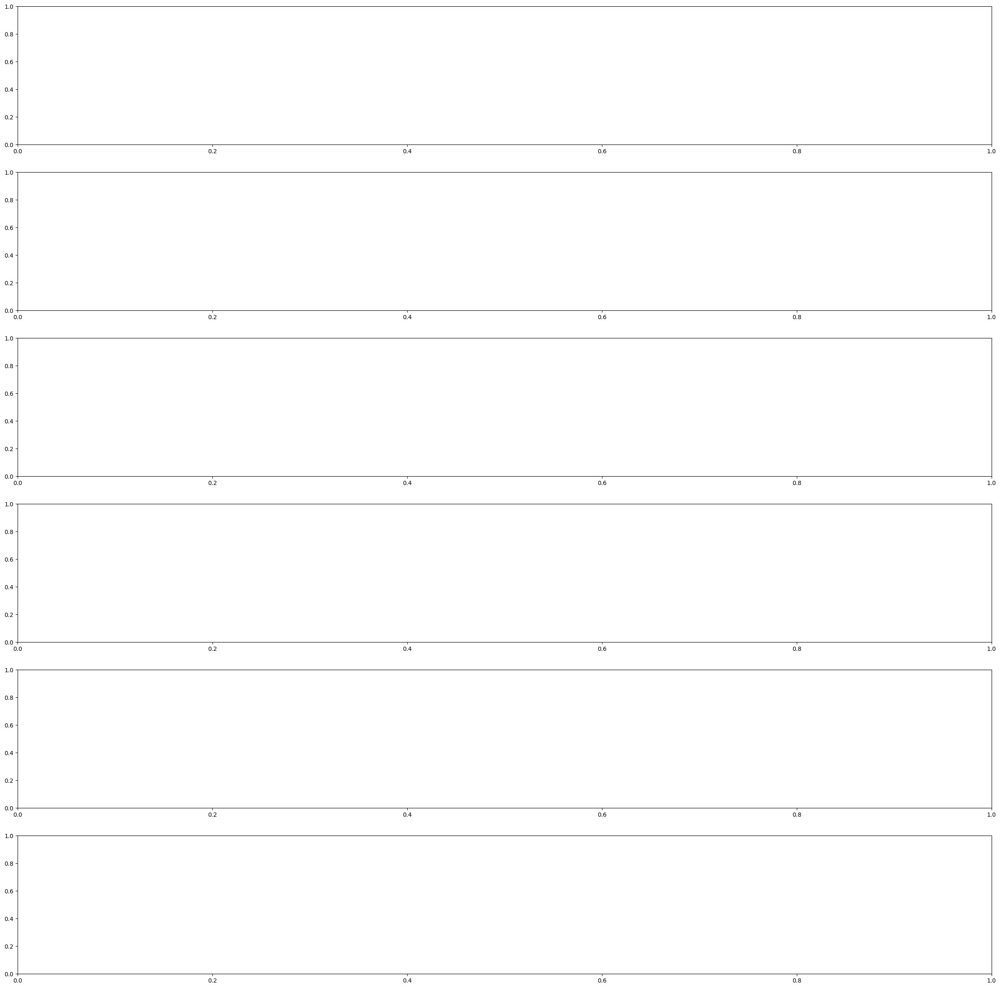

In [12]:
# 4-column comparison with SuperPoint+LightGlue matches:

if 'matcher' not in globals():
    if 'SuperPointLightGlueMagsacMatcher' in globals():
        matcher = SuperPointLightGlueMagsacMatcher(
            min_conf=MATCH_MIN_CONF,
            max_num_keypoints=MAX_NUM_KEYPOINTS,
        )
        print('matcher was undefined: initialized a new matcher instance.')
    else:
        raise RuntimeError(
            "'matcher' is not defined. Run the cell '# SuperPoint + LightGlue + MAGSAC matcher' first."
        )

# [col1=anchor filtered | col2=crop filtered] and [col3=val filtered | col4=crop filtered]

PAIR_ANCHOR_ID = 13
PAIR_VAL_ID = 14
PREVIEW_PAIR_INDEX = 0  # fallback if pair not found

MAX_DRAW_MATCHES = 120
RNG_SEED = 7

# -------------------------
# pair selection + data load
# -------------------------
sel = pair_df[
    (pair_df["anchor_id"].astype(int) == int(PAIR_ANCHOR_ID)) &
    (pair_df["val_id"].astype(int) == int(PAIR_VAL_ID))
]
if len(sel) == 0:
    idx = int(np.clip(PREVIEW_PAIR_INDEX, 0, len(pair_df) - 1))
    pr = pair_df.iloc[idx]
    print(f"Pair {PAIR_ANCHOR_ID}->{PAIR_VAL_ID} not found, using pair index {idx}.")
else:
    pr = sel.iloc[0]

anchor_xy = (float(pr["anchor_x"]), float(pr["anchor_y"]))
val_xy = (float(pr["val_gt_x"]), float(pr["val_gt_y"]))

anchor_rgb = load_train_image_cached(int(pr["anchor_id"]), max_side=IMAGE_MAX_SIDE)
val_rgb = load_train_image_cached(int(pr["val_id"]), max_side=IMAGE_MAX_SIDE)

tile_size = int(np.clip(
    round(float(CONST_MAP_CROP_BASE_PX) * float(CONST_MAP_CROP_SCALE)),
    int(CONST_MAP_CROP_MIN_PX),
    min(MAP_W, MAP_H, int(CONST_MAP_CROP_MAX_PX)),
))
crop_rgb, x0, y0 = extract_crop_by_size(map_rgb, center_xy=anchor_xy, crop_w=tile_size, crop_h=tile_size)

ax_local, ay_local = anchor_xy[0] - x0, anchor_xy[1] - y0
vx_local, vy_local = val_xy[0] - x0, val_xy[1] - y0

# -------------------------
# filter variants
# -------------------------
EDGE_LOW = EDGE_CANNY_LOW
EDGE_HIGH = EDGE_CANNY_HIGH
EDGE_DILATE = EDGE_DILATE_KERNEL

def _to_rgb_uint8(img):
    if img.ndim == 2:
        img = cv2.cvtColor(img.astype(np.uint8), cv2.COLOR_GRAY2RGB)
    if img.dtype != np.uint8:
        img = np.clip(img, 0, 255).astype(np.uint8)
    return img

def _gray(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

def _shadow_clahe_rgb(img, clip=2.5, grid=(8, 8)):
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=float(clip), tileGridSize=tuple(grid))
    l2 = clahe.apply(l)
    return cv2.cvtColor(cv2.merge([l2, a, b]), cv2.COLOR_LAB2RGB)

def _edges(gray):
    e = cv2.Canny(gray, int(EDGE_LOW), int(EDGE_HIGH))
    k = int(max(1, EDGE_DILATE))
    if k > 1:
        e = cv2.dilate(e, np.ones((k, k), dtype=np.uint8), iterations=1)
    return e

def f_raw(img):
    return img

def f_gray(img):
    return _gray(img)

def f_shadow(img):
    return _shadow_clahe_rgb(img, clip=CLAHE_CLIP_LIMIT, grid=CLAHE_GRID)

def f_gray_edge_binary(img):
    return _edges(_gray(img))

def f_gray_edge_blend(img):
    g = _gray(img)
    e = _edges(g)
    return cv2.addWeighted(g, 0.70, e, 0.30, 0.0)

def f_denoise_edge(img):
    g = _gray(img)
    g = cv2.bilateralFilter(g, d=7, sigmaColor=50, sigmaSpace=50)
    return _edges(g)

FILTER_VARIANTS = [
    ("raw_rgb", f_raw),
    ("gray", f_gray),
    ("shadow_clahe_rgb", f_shadow),
    ("gray_edge_binary", f_gray_edge_binary),
    ("gray_edge_blend", f_gray_edge_blend),
    ("denoise_edge", f_denoise_edge),
]

# -------------------------
# matching + drawing helpers
# -------------------------
def _run_match(imgL_rgb, imgR_rgb):
    m = matcher.match(imgL_rgb, imgR_rgb, min_conf=MATCH_MIN_CONF)
    H, inl = matcher.magsac_homography(
        m["k0"], m["k1"], m["matches"], reproj_thr=MAGSAC_REPROJ_THR
    )
    return m, H, inl

def _pick_draw_idx(m, inl, max_draw=120, seed=7):
    n = int(m["matches"].shape[0])
    if n == 0:
        return np.zeros((0,), dtype=np.int32)

    if inl is not None and np.any(inl):
        idx = np.where(inl.astype(bool))[0]
    else:
        idx = np.arange(n, dtype=np.int32)

    if idx.size <= max_draw:
        return idx

    conf = m.get("conf", None)
    if conf is not None and len(conf) == n:
        order = np.argsort(-conf[idx])[:max_draw]
        return idx[order]

    rng = np.random.default_rng(int(seed))
    return np.sort(rng.choice(idx, size=max_draw, replace=False))

def _build_4col_canvas(img1, crop1, img2, crop2):
    # returns canvas + placement dict with (x,y,w,h)
    h = max(img1.shape[0], crop1.shape[0], img2.shape[0], crop2.shape[0])
    w1, w2, w3, w4 = img1.shape[1], crop1.shape[1], img2.shape[1], crop2.shape[1]
    W = w1 + w2 + w3 + w4
    canvas = np.zeros((h, W, 3), dtype=np.uint8)

    def put(im, x):
        y = (h - im.shape[0]) // 2
        canvas[y:y + im.shape[0], x:x + im.shape[1]] = im
        return (x, y, im.shape[1], im.shape[0])

    p1 = put(img1, 0)
    p2 = put(crop1, w1)
    p3 = put(img2, w1 + w2)
    p4 = put(crop2, w1 + w2 + w3)
    return canvas, {"img1": p1, "crop1": p2, "img2": p3, "crop2": p4}

# -------------------------
# plot
# -------------------------
nrows = len(FILTER_VARIANTS)
fig, axes = plt.subplots(nrows, 1, figsize=(30, 5.0 * nrows))
if nrows == 1:
    axes = [axes]

for ax, (name, fn) in zip(axes, FILTER_VARIANTS):
    # apply filter
    a_f = _to_rgb_uint8(fn(anchor_rgb))
    v_f = _to_rgb_uint8(fn(val_rgb))
    c_f = _to_rgb_uint8(fn(crop_rgb))

    # run SP+LG+MAGSAC
    m_ac, H_ac, inl_ac = _run_match(a_f, c_f)
    m_vc, H_vc, inl_vc = _run_match(v_f, c_f)

    idx_ac = _pick_draw_idx(m_ac, inl_ac, max_draw=MAX_DRAW_MATCHES, seed=RNG_SEED)
    idx_vc = _pick_draw_idx(m_vc, inl_vc, max_draw=MAX_DRAW_MATCHES, seed=RNG_SEED)

    # 4 columns in one canvas:
    # [anchor | crop] [val | crop]
    canvas, pos = _build_4col_canvas(a_f, c_f, v_f, c_f)

    ax.imshow(canvas)
    ax.axis("off")

    # separators
    x_sep1 = pos["crop1"][0] - 0.5
    x_sep2 = pos["img2"][0] - 0.5
    x_sep3 = pos["crop2"][0] - 0.5
    ax.axvline(x_sep1, color="white", linewidth=1.0, alpha=0.6)
    ax.axvline(x_sep2, color="white", linewidth=1.0, alpha=0.6)
    ax.axvline(x_sep3, color="white", linewidth=1.0, alpha=0.6)

    # draw matches anchor->crop (cyan)
    x1, y1, _, _ = pos["img1"]
    x2, y2, _, _ = pos["crop1"]
    for i in idx_ac:
        a = int(m_ac["matches"][i, 0])
        b = int(m_ac["matches"][i, 1])
        p0 = m_ac["k0"][a]
        p1 = m_ac["k1"][b]
        is_inl = bool(inl_ac[i]) if inl_ac is not None and i < len(inl_ac) else False
        ax.plot(
            [float(p0[0] + x1), float(p1[0] + x2)],
            [float(p0[1] + y1), float(p1[1] + y2)],
            color="cyan",
            linewidth=1.2 if is_inl else 0.6,
            alpha=0.9 if is_inl else 0.3,
        )

    # draw matches val->crop (orange)
    x3, y3, _, _ = pos["img2"]
    x4, y4, _, _ = pos["crop2"]
    for i in idx_vc:
        a = int(m_vc["matches"][i, 0])
        b = int(m_vc["matches"][i, 1])
        p0 = m_vc["k0"][a]
        p1 = m_vc["k1"][b]
        is_inl = bool(inl_vc[i]) if inl_vc is not None and i < len(inl_vc) else False
        ax.plot(
            [float(p0[0] + x3), float(p1[0] + x4)],
            [float(p0[1] + y3), float(p1[1] + y4)],
            color="orange",
            linewidth=1.2 if is_inl else 0.6,
            alpha=0.9 if is_inl else 0.3,
        )

    # GT points on both crop columns
    ax.scatter([ax_local + x2], [ay_local + y2], s=30, c="red")
    ax.scatter([vx_local + x2], [vy_local + y2], s=28, c="cyan")
    ax.scatter([ax_local + x4], [ay_local + y4], s=30, c="red")
    ax.scatter([vx_local + x4], [vy_local + y4], s=28, c="cyan")

    n_ac = int(m_ac["matches"].shape[0]); in_ac = int(inl_ac.sum()) if inl_ac is not None else 0
    n_vc = int(m_vc["matches"].shape[0]); in_vc = int(inl_vc.sum()) if inl_vc is not None else 0
    ax.set_title(
        f"{name} | anchor->crop raw={n_ac} inl={in_ac} | val->crop raw={n_vc} inl={in_vc} | "
        f"pair={int(pr['anchor_id'])}->{int(pr['val_id'])}"
    )

plt.tight_layout()
plt.show()



In [ ]:
# Geometry helpers for anchor-derived priors and one-axis constraint

def estimate_scale_angle_from_homography(H: np.ndarray) -> Tuple[float, float]:
    if H is None:
        return 1.0, 0.0

    A = H[:2, :2].astype(np.float64)
    c0 = np.linalg.norm(A[:, 0])
    c1 = np.linalg.norm(A[:, 1])
    scale = float(max(1e-6, 0.5 * (c0 + c1)))

    angle = float(np.degrees(np.arctan2(A[1, 0], A[0, 0])))
    return scale, angle


def dominant_axis_from_inliers(k0: np.ndarray, k1: np.ndarray, matches: np.ndarray, inlier_mask: np.ndarray) -> np.ndarray:
    if matches.shape[0] == 0 or inlier_mask is None:
        return np.array([1.0, 0.0], dtype=np.float32)

    idx = np.where(inlier_mask.astype(bool))[0]
    if idx.size < 2:
        return np.array([1.0, 0.0], dtype=np.float32)

    p0 = k0[matches[idx, 0]].astype(np.float32)
    p1 = k1[matches[idx, 1]].astype(np.float32)
    disp = p1 - p0

    if disp.shape[0] < 2:
        return np.array([1.0, 0.0], dtype=np.float32)

    centered = disp - disp.mean(axis=0, keepdims=True)
    nrm = float(np.linalg.norm(centered))
    if nrm < 1e-6:
        v = np.median(disp, axis=0)
        vn = float(np.linalg.norm(v))
        if vn < 1e-6:
            return np.array([1.0, 0.0], dtype=np.float32)
        return (v / vn).astype(np.float32)

    _, _, vh = np.linalg.svd(centered, full_matrices=False)
    u = vh[0].astype(np.float32)
    un = float(np.linalg.norm(u))
    if un < 1e-6:
        return np.array([1.0, 0.0], dtype=np.float32)
    return u / un


def constrain_point_to_axis(point_xy: Tuple[float, float], anchor_xy: Tuple[float, float], axis_u: np.ndarray) -> Tuple[float, float]:
    p = np.array([float(point_xy[0]), float(point_xy[1])], dtype=np.float64)
    a = np.array([float(anchor_xy[0]), float(anchor_xy[1])], dtype=np.float64)
    u = np.array(axis_u, dtype=np.float64)
    un = float(np.linalg.norm(u))
    if un < 1e-9:
        return float(point_xy[0]), float(point_xy[1])
    u = u / un

    v = p - a
    t = float(np.dot(v, u))
    q = a + t * u
    return float(q[0]), float(q[1])


In [ ]:
# Backend benchmark on crop matching (SIFT vs SuperPoint+LightGlue vs LoFTR)
PAIR_ANCHOR_ID = 13
PAIR_VAL_ID = 14
PREVIEW_PAIR_INDEX = 0

BENCH_MAX_DRAW = 120
BENCH_TOP_SHOW = 8
SIFT_RATIO_TEST = 0.85
LOFTR_MIN_CONF = 0.10

BENCH_SCALES = [0.12, 0.16, 0.20, 0.26, 0.34, 0.45, 0.60, 0.80, 1.00]
BENCH_ROTS = [-25.0, -15.0, -8.0, 0.0, 8.0, 15.0, 25.0]

# Select pair
sel = pair_df[
    (pair_df['anchor_id'].astype(int) == int(PAIR_ANCHOR_ID)) &
    (pair_df['val_id'].astype(int) == int(PAIR_VAL_ID))
]
if len(sel) == 0:
    idx = int(np.clip(PREVIEW_PAIR_INDEX, 0, len(pair_df) - 1))
    pr = pair_df.iloc[idx]
    print(f'Pair {PAIR_ANCHOR_ID}->{PAIR_VAL_ID} not found, using pair index {idx}.')
else:
    pr = sel.iloc[0]

anchor_xy = (float(pr['anchor_x']), float(pr['anchor_y']))
val_xy = (float(pr['val_gt_x']), float(pr['val_gt_y']))

anchor_rgb = load_train_image_cached(int(pr['anchor_id']), max_side=IMAGE_MAX_SIDE)
val_rgb = load_train_image_cached(int(pr['val_id']), max_side=IMAGE_MAX_SIDE)

tile_size = int(np.clip(
    round(float(CONST_MAP_CROP_BASE_PX) * float(CONST_MAP_CROP_SCALE)),
    int(CONST_MAP_CROP_MIN_PX),
    min(MAP_W, MAP_H, int(CONST_MAP_CROP_MAX_PX)),
))
crop_rgb, x0, y0 = extract_crop_by_size(map_rgb, center_xy=anchor_xy, crop_w=tile_size, crop_h=tile_size)

ax_local, ay_local = anchor_xy[0] - x0, anchor_xy[1] - y0
vx_local, vy_local = val_xy[0] - x0, val_xy[1] - y0

# ---------- filters ----------
def _gray(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

def _shadow_clahe_rgb(img, clip=2.5, grid=(8, 8)):
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=float(clip), tileGridSize=tuple(grid))
    l2 = clahe.apply(l)
    return cv2.cvtColor(cv2.merge([l2, a, b]), cv2.COLOR_LAB2RGB)

def _edges(gray):
    e = cv2.Canny(gray, int(EDGE_CANNY_LOW), int(EDGE_CANNY_HIGH))
    k = int(max(1, EDGE_DILATE_KERNEL))
    if k > 1:
        e = cv2.dilate(e, np.ones((k, k), dtype=np.uint8), iterations=1)
    return e

def f_raw(img):
    return img

def f_gray(img):
    return _gray(img)

def f_shadow(img):
    return _shadow_clahe_rgb(img, clip=CLAHE_CLIP_LIMIT, grid=CLAHE_GRID)

def f_gray_edge_binary(img):
    return _edges(_gray(img))

def f_gray_edge_blend(img):
    g = _gray(img)
    e = _edges(g)
    return cv2.addWeighted(g, 0.70, e, 0.30, 0.0)

def f_denoise_edge(img):
    g = cv2.bilateralFilter(_gray(img), d=7, sigmaColor=50, sigmaSpace=50)
    return _edges(g)

FILTER_VARIANTS = [
    ('raw_rgb', f_raw),
    ('gray', f_gray),
    ('shadow_clahe_rgb', f_shadow),
    ('gray_edge_binary', f_gray_edge_binary),
    ('gray_edge_blend', f_gray_edge_blend),
    ('denoise_edge', f_denoise_edge),
]

# ---------- generic helpers ----------
def _to_rgb_uint8(im):
    if im.ndim == 2:
        im = cv2.cvtColor(im.astype(np.uint8), cv2.COLOR_GRAY2RGB)
    if im.dtype != np.uint8:
        im = np.clip(im, 0, 255).astype(np.uint8)
    return im

def magsac_homography(k0: np.ndarray, k1: np.ndarray, matches: np.ndarray, reproj_thr: float = 4.0):
    if matches.shape[0] < 8:
        return None, np.zeros((matches.shape[0],), dtype=bool)
    p0 = k0[matches[:, 0]].astype(np.float32)
    p1 = k1[matches[:, 1]].astype(np.float32)
    H, mask = cv2.findHomography(
        p0,
        p1,
        method=cv2.USAC_MAGSAC,
        ransacReprojThreshold=float(reproj_thr),
        maxIters=10000,
        confidence=0.999,
    )
    if H is None or mask is None:
        return None, np.zeros((matches.shape[0],), dtype=bool)
    return H, mask.ravel().astype(bool)

# ---------- backends ----------
def run_sp_lg(img0_rgb, img1_rgb):
    if 'matcher' not in globals():
        raise RuntimeError("Run matcher cell first: '# SuperPoint + LightGlue + MAGSAC matcher'.")
    m = matcher.match(img0_rgb, img1_rgb, min_conf=MATCH_MIN_CONF)
    return m['k0'], m['k1'], m['matches'], m['conf']

def run_sift(img0_rgb, img1_rgb):
    g0 = cv2.cvtColor(img0_rgb, cv2.COLOR_RGB2GRAY)
    g1 = cv2.cvtColor(img1_rgb, cv2.COLOR_RGB2GRAY)

    if not hasattr(cv2, 'SIFT_create'):
        raise RuntimeError('OpenCV build has no SIFT (cv2.SIFT_create missing).')

    sift = cv2.SIFT_create(nfeatures=6000, contrastThreshold=0.01, edgeThreshold=10)
    kp0, d0 = sift.detectAndCompute(g0, None)
    kp1, d1 = sift.detectAndCompute(g1, None)

    if d0 is None or d1 is None or len(kp0) == 0 or len(kp1) == 0:
        return np.zeros((0, 2), np.float32), np.zeros((0, 2), np.float32), np.zeros((0, 2), np.int32), np.zeros((0,), np.float32)

    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
    knn = bf.knnMatch(d0, d1, k=2)

    good = []
    for pair in knn:
        if len(pair) < 2:
            continue
        m, n = pair
        if m.distance < float(SIFT_RATIO_TEST) * n.distance:
            good.append(m)

    k0 = np.array([k.pt for k in kp0], dtype=np.float32)
    k1 = np.array([k.pt for k in kp1], dtype=np.float32)

    if len(good) == 0:
        return k0, k1, np.zeros((0, 2), np.int32), np.zeros((0,), np.float32)

    matches = np.array([[m.queryIdx, m.trainIdx] for m in good], dtype=np.int32)
    conf = np.array([1.0 / (m.distance + 1e-6) for m in good], dtype=np.float32)
    conf /= max(1e-6, float(conf.max()))
    return k0, k1, matches, conf

_LOFTR_MODEL = None
_LOFTR_DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

def _loftr_model():
    global _LOFTR_MODEL
    if _LOFTR_MODEL is None:
        from kornia.feature import LoFTR
        _LOFTR_MODEL = LoFTR(pretrained='outdoor').eval().to(_LOFTR_DEVICE)
    return _LOFTR_MODEL

def run_loftr(img0_rgb, img1_rgb):
    model = _loftr_model()
    g0 = cv2.cvtColor(img0_rgb, cv2.COLOR_RGB2GRAY)
    g1 = cv2.cvtColor(img1_rgb, cv2.COLOR_RGB2GRAY)
    t0 = torch.from_numpy(g0).float()[None, None].to(_LOFTR_DEVICE) / 255.0
    t1 = torch.from_numpy(g1).float()[None, None].to(_LOFTR_DEVICE) / 255.0

    with torch.inference_mode():
        out = model({'image0': t0, 'image1': t1})

    if 'keypoints0' not in out or out['keypoints0'].numel() == 0:
        return np.zeros((0, 2), np.float32), np.zeros((0, 2), np.float32), np.zeros((0, 2), np.int32), np.zeros((0,), np.float32)

    k0 = out['keypoints0'].detach().cpu().numpy().astype(np.float32)
    k1 = out['keypoints1'].detach().cpu().numpy().astype(np.float32)
    if 'confidence' in out:
        conf = out['confidence'].detach().cpu().numpy().astype(np.float32)
    else:
        conf = np.ones((k0.shape[0],), dtype=np.float32)

    keep = conf >= float(LOFTR_MIN_CONF)
    k0, k1, conf = k0[keep], k1[keep], conf[keep]

    n = k0.shape[0]
    matches = np.column_stack([np.arange(n), np.arange(n)]).astype(np.int32)
    return k0, k1, matches, conf

BACKENDS = [
    ('superpoint_lightglue', run_sp_lg),
    ('sift', run_sift),
]

try:
    from kornia.feature import LoFTR  # noqa: F401
    BACKENDS.append(('loftr', run_loftr))
except Exception:
    print('LoFTR not available: skipping LoFTR backend (install kornia to enable).')

# ---------- sweep evaluator ----------
def run_backend_with_sweep(img_query, img_ref, backend_fn):
    best = None
    for s in BENCH_SCALES:
        q_s = resize_rgb(img_query, s) if abs(float(s) - 1.0) > 1e-6 else img_query
        for r in BENCH_ROTS:
            q_sr = rotate_rgb_keep_size(q_s, r) if abs(float(r)) > 1e-6 else q_s
            try:
                k0, k1, m, c = backend_fn(q_sr, img_ref)
                H, inl = magsac_homography(k0, k1, m, reproj_thr=MAGSAC_REPROJ_THR)
                raw = int(m.shape[0])
                inliers = int(inl.sum()) if inl is not None else 0
                ok = True
                err = ''
            except Exception as e:
                k0 = k1 = np.zeros((0,2), np.float32)
                m = np.zeros((0,2), np.int32)
                c = np.zeros((0,), np.float32)
                inl = np.zeros((0,), bool)
                H = None
                raw = inliers = 0
                ok = False
                err = str(e)

            cand = {
                'query_used': q_sr,
                'scale': float(s),
                'rot_deg': float(r),
                'k0': k0,
                'k1': k1,
                'matches': m,
                'conf': c,
                'H': H,
                'inlier_mask': inl,
                'raw': raw,
                'inliers': inliers,
                'ok': ok,
                'error': err,
                'score': (inliers, raw),
            }
            if best is None or cand['score'] > best['score']:
                best = cand

    return best

# ---------- run benchmark ----------
rows = []
vis_cache = {}

for f_name, f_fn in FILTER_VARIANTS:
    a = _to_rgb_uint8(f_fn(anchor_rgb))
    v = _to_rgb_uint8(f_fn(val_rgb))
    c = _to_rgb_uint8(f_fn(crop_rgb))

    for b_name, b_fn in BACKENDS:
        best_ac = run_backend_with_sweep(a, c, b_fn)
        best_vc = run_backend_with_sweep(v, c, b_fn)

        rows.append({
            'backend': b_name,
            'filter': f_name,
            'anchor_raw': int(best_ac['raw']),
            'anchor_inliers': int(best_ac['inliers']),
            'anchor_scale': float(best_ac['scale']),
            'anchor_rot': float(best_ac['rot_deg']),
            'val_raw': int(best_vc['raw']),
            'val_inliers': int(best_vc['inliers']),
            'val_scale': float(best_vc['scale']),
            'val_rot': float(best_vc['rot_deg']),
            'val_inlier_ratio': float(best_vc['inliers'] / max(1, best_vc['raw'])),
            'ok': bool(best_ac['ok'] and best_vc['ok']),
            'error': '; '.join([x for x in [best_ac['error'], best_vc['error']] if x]),
        })

        vis_cache[(b_name, f_name)] = {
            'a': a, 'v': v, 'c': c,
            'ac': best_ac,
            'vc': best_vc,
        }

bench_df = pd.DataFrame(rows).sort_values(['val_inliers', 'val_raw'], ascending=False).reset_index(drop=True)

display(bench_df)
print('Pivot: val_inliers')
display(bench_df.pivot_table(index='filter', columns='backend', values='val_inliers', aggfunc='max'))

# ---------- visualize top results ----------
def _draw_pair(ax, left_used, right, k0, k1, m, inl, color, title, max_draw=120):
    h = max(left_used.shape[0], right.shape[0])
    w0, w1 = left_used.shape[1], right.shape[1]
    canvas = np.zeros((h, w0 + w1, 3), dtype=np.uint8)
    y0 = (h - left_used.shape[0]) // 2
    y1 = (h - right.shape[0]) // 2
    canvas[y0:y0 + left_used.shape[0], :w0] = left_used
    canvas[y1:y1 + right.shape[0], w0:w0 + right.shape[1]] = right

    ax.imshow(canvas)
    ax.axis('off')

    n = int(m.shape[0])
    if n == 0:
        ax.set_title(title + ' | raw=0 inl=0')
        return

    if inl is not None and len(inl) == n and np.any(inl):
        idx = np.where(inl.astype(bool))[0]
    else:
        idx = np.arange(n)

    if idx.size > max_draw:
        idx = idx[:max_draw]

    for i in idx:
        a_idx = int(m[i, 0])
        b_idx = int(m[i, 1])
        p0 = k0[a_idx]
        p1 = k1[b_idx]
        ax.plot([p0[0], p1[0] + w0], [p0[1] + y0, p1[1] + y1], color=color, linewidth=1.0, alpha=0.8)

    ax.scatter([ax_local + w0], [ay_local + y1], s=26, c='red')
    ax.scatter([vx_local + w0], [vy_local + y1], s=24, c='cyan')

    inl_n = int(inl.sum()) if inl is not None and len(inl) == n else 0
    ax.set_title(f'{title} | raw={n} inl={inl_n}')

ok_df = bench_df.copy()
if len(ok_df) > 0:
    show_df = ok_df.head(int(min(BENCH_TOP_SHOW, len(ok_df))))
    for rr in show_df.itertuples(index=False):
        d = vis_cache[(rr.backend, rr.filter)]
        ac = d['ac']
        vc = d['vc']

        fig, axs = plt.subplots(1, 2, figsize=(18, 6))
        _draw_pair(
            axs[0],
            ac['query_used'], d['c'], ac['k0'], ac['k1'], ac['matches'], ac['inlier_mask'],
            color='cyan',
            title=f"{rr.filter} | {rr.backend} | anchor->crop | s={ac['scale']:.2f} r={ac['rot_deg']:.1f}",
            max_draw=BENCH_MAX_DRAW,
        )
        _draw_pair(
            axs[1],
            vc['query_used'], d['c'], vc['k0'], vc['k1'], vc['matches'], vc['inlier_mask'],
            color='orange',
            title=f"{rr.filter} | {rr.backend} | val->crop | s={vc['scale']:.2f} r={vc['rot_deg']:.1f}",
            max_draw=BENCH_MAX_DRAW,
        )
        plt.tight_layout()
        plt.show()
else:
    print('No benchmark results to visualize.')



In [ ]:
# Pair localization logic

def _run_match_sweep(
    query_rgb: np.ndarray,
    ref_rgb: np.ndarray,
    scales: List[float],
    rots_deg: List[float],
    min_conf: float,
) -> Dict[str, object]:
    best = None

    for s in scales:
        s = float(s)
        if s <= 0.0:
            continue
        q_s = resize_rgb(query_rgb, s) if abs(s - 1.0) > 1e-6 else query_rgb

        for rdeg in rots_deg:
            rdeg = float(rdeg)
            q_sr = rotate_rgb_keep_size(q_s, rdeg) if abs(rdeg) > 1e-6 else q_s

            m = matcher.match(q_sr, ref_rgb, min_conf=min_conf)
            H, inl = matcher.magsac_homography(
                m['k0'],
                m['k1'],
                m['matches'],
                reproj_thr=MAGSAC_REPROJ_THR,
            )

            raw = int(m['matches'].shape[0])
            inliers = int(inl.sum()) if inl is not None else 0

            score = (inliers, raw)
            cand = {
                'query_used': q_sr,
                'scale': float(s),
                'rot_deg': float(rdeg),
                'match': m,
                'H': H,
                'inlier_mask': inl,
                'raw_matches': raw,
                'inliers': inliers,
                'score': score,
            }

            if best is None or cand['score'] > best['score']:
                best = cand

    if best is None:
        best = {
            'query_used': query_rgb,
            'scale': 1.0,
            'rot_deg': 0.0,
            'match': {
                'k0': np.zeros((0, 2), dtype=np.float32),
                'k1': np.zeros((0, 2), dtype=np.float32),
                'matches': np.zeros((0, 2), dtype=np.int32),
                'conf': np.zeros((0,), dtype=np.float32),
            },
            'H': None,
            'inlier_mask': np.zeros((0,), dtype=bool),
            'raw_matches': 0,
            'inliers': 0,
            'score': (0, 0),
        }

    return best


def localize_pair(row, return_debug: bool = False) -> Dict[str, object]:
    aid = int(row.anchor_id)
    vid = int(row.val_id)
    anchor_gt = (float(row.anchor_x), float(row.anchor_y))
    val_gt = (float(row.val_gt_x), float(row.val_gt_y))

    t0 = perf_counter()

    # Preprocessed train images
    anchor_img = get_match_image(aid)
    val_img = get_match_image(vid)

    # --- Stage A: anchor -> local map crop (estimate scale/rotation prior) ---
    seed_scale = float(np.clip(float(ANCHOR_INIT_SCALE_HINT), float(SCALE_HINT_MIN), float(SCALE_HINT_MAX)))
    anchor_seed = resize_rgb(anchor_img, seed_scale)

    calib_w = int(np.clip(
        round(float(ANCHOR_CALIB_TILE_FACTOR) * float(anchor_seed.shape[1])),
        int(ANCHOR_CALIB_MIN_PX),
        MAP_W,
    ))
    calib_h = int(np.clip(
        round(float(ANCHOR_CALIB_TILE_FACTOR) * float(anchor_seed.shape[0])),
        int(ANCHOR_CALIB_MIN_PX),
        MAP_H,
    ))

    map_calib_rgb, calib_x0, calib_y0 = extract_crop_by_size(
        map_rgb,
        center_xy=anchor_gt,
        crop_w=calib_w,
        crop_h=calib_h,
    )
    map_calib = preprocess_for_matching(
        map_calib_rgb,
        enable_gray=ENABLE_GRAY_FILTER,
        enable_shadow=ENABLE_SHADOW_FILTER,
        enable_edge=ENABLE_EDGE_FILTER,
        canny_low=EDGE_CANNY_LOW,
        canny_high=EDGE_CANNY_HIGH,
    )

    anchor_scales = [float(np.clip(seed_scale * x, SCALE_HINT_MIN, SCALE_HINT_MAX)) for x in SWEEP_SCALES_ANCHOR]
    anchor_scales = sorted(set(anchor_scales))
    anchor_rots = [float(x) for x in SWEEP_ROTS_ANCHOR]

    best_anchor = _run_match_sweep(
        query_rgb=anchor_img,
        ref_rgb=map_calib,
        scales=anchor_scales,
        rots_deg=anchor_rots,
        min_conf=MATCH_MIN_CONF,
    )

    ma = best_anchor['match']
    H_anchor = best_anchor['H']
    inl_anchor = best_anchor['inlier_mask']

    anchor_raw_matches = int(best_anchor['raw_matches'])
    anchor_inliers = int(best_anchor['inliers'])

    scale_hint = float(best_anchor['scale'])
    rot_hint_deg = float(best_anchor['rot_deg'])

    if H_anchor is not None and anchor_inliers >= int(MIN_INLIERS_ANCHOR):
        scale_rel, rot_est_deg = estimate_scale_angle_from_homography(H_anchor)
        scale_hint = float(scale_hint * float(scale_rel))
        rot_hint_deg = float(rot_hint_deg + float(rot_est_deg))

    scale_hint = float(np.clip(scale_hint, float(SCALE_HINT_MIN), float(SCALE_HINT_MAX)))
    rot_hint_deg = float(np.clip(rot_hint_deg, -float(ROT_HINT_ABS_MAX_DEG), float(ROT_HINT_ABS_MAX_DEG)))

    # --- Stage B: validation -> fixed-size local map tile around anchor GT ---
    tile_size = int(np.clip(
        round(float(CONST_MAP_CROP_BASE_PX) * float(CONST_MAP_CROP_SCALE)),
        int(CONST_MAP_CROP_MIN_PX),
        min(MAP_W, MAP_H, int(CONST_MAP_CROP_MAX_PX)),
    ))
    tile_w = int(tile_size)
    tile_h = int(tile_size)

    map_tile_rgb, tile_x0, tile_y0 = extract_crop_by_size(
        map_rgb,
        center_xy=anchor_gt,
        crop_w=tile_w,
        crop_h=tile_h,
    )
    map_tile = preprocess_for_matching(
        map_tile_rgb,
        enable_gray=ENABLE_GRAY_FILTER,
        enable_shadow=ENABLE_SHADOW_FILTER,
        enable_edge=ENABLE_EDGE_FILTER,
        canny_low=EDGE_CANNY_LOW,
        canny_high=EDGE_CANNY_HIGH,
    )

    val_scales = [float(np.clip(scale_hint * x, SCALE_HINT_MIN, SCALE_HINT_MAX)) for x in SWEEP_SCALES_VAL_MUL]
    val_scales = sorted(set(val_scales))
    val_rots = [float(np.clip(rot_hint_deg + d, -ROT_HINT_ABS_MAX_DEG, ROT_HINT_ABS_MAX_DEG)) for d in SWEEP_ROTS_VAL_DELTA]
    val_rots = sorted(set(val_rots))

    best_val = _run_match_sweep(
        query_rgb=val_img,
        ref_rgb=map_tile,
        scales=val_scales,
        rots_deg=val_rots,
        min_conf=MATCH_MIN_CONF,
    )

    val_query = best_val['query_used']
    mv = best_val['match']
    H_val = best_val['H']
    inl_val = best_val['inlier_mask']
    raw_matches = int(best_val['raw_matches'])
    inliers = int(best_val['inliers'])

    anchor_local = (float(anchor_gt[0] - tile_x0), float(anchor_gt[1] - tile_y0))

    used_match = False
    pred_local_raw = (float(anchor_local[0]), float(anchor_local[1]))
    pred_local = (float(anchor_local[0]), float(anchor_local[1]))

    if H_val is not None and inliers >= int(MIN_INLIERS_VAL):
        q_center = (float(val_query.shape[1] * 0.5), float(val_query.shape[0] * 0.5))
        px_local, py_local = project_point_homography(H_val, q_center)
        if np.isfinite(px_local) and np.isfinite(py_local):
            pred_local_raw = (float(px_local), float(py_local))
            pred_local = pred_local_raw
            used_match = True

            # Optional 1-axis constraint around anchor (rough planar/track assumption)
            if bool(ENABLE_AXIS_CONSTRAINT) and inliers >= int(AXIS_MIN_INLIERS):
                axis_u = dominant_axis_from_inliers(
                    mv['k0'],
                    mv['k1'],
                    mv['matches'],
                    inl_val,
                )
                pred_local = constrain_point_to_axis(pred_local_raw, anchor_local, axis_u)

    pred_x = float(np.clip(pred_local[0] + tile_x0, 0, MAP_W - 1))
    pred_y = float(np.clip(pred_local[1] + tile_y0, 0, MAP_H - 1))

    err_px = float(np.hypot(pred_x - val_gt[0], pred_y - val_gt[1]))
    dt_ms = float((perf_counter() - t0) * 1000.0)

    out = {
        'pair_idx': int(row.pair_idx),
        'anchor_id': aid,
        'val_id': vid,
        'anchor_x': float(anchor_gt[0]),
        'anchor_y': float(anchor_gt[1]),
        'pred_x': float(pred_x),
        'pred_y': float(pred_y),
        'gt_x': float(val_gt[0]),
        'gt_y': float(val_gt[1]),
        'err_px': float(err_px),
        'used_match': bool(used_match),
        'raw_matches': raw_matches,
        'inliers': inliers,
        'anchor_raw_matches': int(anchor_raw_matches),
        'anchor_inliers': int(anchor_inliers),
        'scale_hint': float(scale_hint),
        'rot_hint_deg': float(rot_hint_deg),
        'tile_w': int(map_tile.shape[1]),
        'tile_h': int(map_tile.shape[0]),
        'runtime_ms': dt_ms,
    }

    if return_debug:
        out['debug'] = {
            'val_query': val_query,
            'map_tile': map_tile,
            'val_match': mv,
            'val_inlier_mask': inl_val,
            'anchor_local': anchor_local,
            'pred_local': pred_local,
            'pred_local_raw': pred_local_raw,
            'tile_origin': (int(tile_x0), int(tile_y0)),
            'scale_hint': float(scale_hint),
            'rot_hint_deg': float(rot_hint_deg),
            'anchor_query': best_anchor['query_used'],
            'map_calib': map_calib,
            'anchor_match': ma,
            'anchor_inlier_mask': inl_anchor,
            'anchor_scale_used': float(best_anchor['scale']),
            'anchor_rot_used': float(best_anchor['rot_deg']),
            'val_scale_used': float(best_val['scale']),
            'val_rot_used': float(best_val['rot_deg']),
        }

    return out



In [ ]:
# Run localization across all consecutive pairs
rows = []
for j, r in enumerate(pair_df.itertuples(index=False), 1):
    out = localize_pair(r, return_debug=False)
    rows.append(out)
    if j % 20 == 0:
        print(f'done {j}/{len(pair_df)} | avg_runtime_ms={np.mean([x["runtime_ms"] for x in rows]):.1f}')

val_pred_df = pd.DataFrame(rows).sort_values('pair_idx').reset_index(drop=True)
metrics = eval_metric_from_df(val_pred_df)

print('Pairwise validation metrics:')
print(pd.Series(metrics))

display(val_pred_df.head(20))


In [ ]:
# Global overlay + diagnostic filtered map (similar to previous notebooks)
fit_xy = pair_df[['anchor_x', 'anchor_y']].to_numpy(dtype=np.float32)
v = val_pred_df.copy()

map_diag = preprocess_for_matching(
    map_rgb,
    enable_gray=ENABLE_GRAY_FILTER,
    enable_shadow=ENABLE_SHADOW_FILTER,
    enable_edge=ENABLE_EDGE_FILTER,
    canny_low=EDGE_CANNY_LOW,
    canny_high=EDGE_CANNY_HIGH,
)

fig, axes = plt.subplots(1, 2, figsize=(20, 8))

axes[0].imshow(map_rgb)
if len(fit_xy) > 0:
    axes[0].scatter(fit_xy[:, 0], fit_xy[:, 1], s=8, c='deepskyblue', alpha=0.6, label='fit GT (anchor)')
if len(v) > 0:
    for rr in v.itertuples(index=False):
        axes[0].plot([rr.pred_x, rr.gt_x], [rr.pred_y, rr.gt_y], color='yellow', alpha=0.45, linewidth=1.0)
    axes[0].scatter(v['gt_x'], v['gt_y'], s=20, c='lime', label='val GT')
    axes[0].scatter(v['pred_x'], v['pred_y'], s=20, c='red', label='val pred')
axes[0].set_title(f"Map Overlay | score={metrics['score']:.2f}")
axes[0].legend(loc='upper right')
axes[0].axis('off')

axes[1].imshow(map_diag)
if len(v) > 0:
    axes[1].scatter(v['pred_x'], v['pred_y'], s=18, c='orange', alpha=0.8, label='val pred')
axes[1].set_title('Filtered global map (diagnostic view)')
axes[1].legend(loc='upper right')
axes[1].axis('off')

plt.tight_layout()
plt.show()


In [ ]:
# Pairwise feature-match diagnostics: val image (left) vs local map tile (right)

def make_side_by_side_rgb(img_left: np.ndarray, img_right: np.ndarray) -> Tuple[np.ndarray, int]:
    h = max(img_left.shape[0], img_right.shape[0])
    w0 = img_left.shape[1]
    w1 = img_right.shape[1]
    canvas = np.zeros((h, w0 + w1, 3), dtype=img_left.dtype)
    canvas[:img_left.shape[0], :w0] = img_left
    canvas[:img_right.shape[0], w0:w0 + w1] = img_right
    return canvas, int(w0)


def draw_match_debug(debug: Dict[str, object], title: str, max_lines: int = 250, seed: int = 7) -> None:
    q_img = debug['val_query']
    map_tile = debug['map_tile']
    combo, x_shift = make_side_by_side_rgb(q_img, map_tile)

    m = debug['val_match']
    n_total = int(m['matches'].shape[0])

    inl = debug['val_inlier_mask']
    if inl is None:
        inl_mask = np.zeros((n_total,), dtype=bool)
    else:
        inl_mask = inl.astype(bool)
        if inl_mask.shape[0] != n_total:
            tmp = np.zeros((n_total,), dtype=bool)
            n = min(n_total, inl_mask.shape[0])
            tmp[:n] = inl_mask[:n]
            inl_mask = tmp

    draw_idx = np.arange(n_total)
    if n_total > int(max_lines):
        rng = np.random.default_rng(int(seed))
        draw_idx = np.sort(rng.choice(draw_idx, size=int(max_lines), replace=False))

    fig, ax = plt.subplots(figsize=(20, 8))
    ax.imshow(combo)
    ax.axvline(x=float(x_shift) - 0.5, color='white', linewidth=1.0, alpha=0.9)

    for i in draw_idx:
        a = int(m['matches'][i, 0])
        b = int(m['matches'][i, 1])
        p0 = m['k0'][a]
        p1 = m['k1'][b]
        is_inlier = bool(inl_mask[i])
        color = 'lime' if is_inlier else 'orangered'
        lw = 1.2 if is_inlier else 0.6
        alpha = 0.85 if is_inlier else 0.25
        ax.plot([float(p0[0]), float(p1[0] + x_shift)], [float(p0[1]), float(p1[1])], color=color, linewidth=lw, alpha=alpha)

    if n_total > 0:
        ax.scatter(m['k0'][:, 0], m['k0'][:, 1], s=7, c='deepskyblue', alpha=0.55)
        ax.scatter(m['k1'][:, 0] + x_shift, m['k1'][:, 1], s=7, c='orange', alpha=0.55)

    ax.scatter(
        [float(debug['anchor_local'][0] + x_shift)],
        [float(debug['anchor_local'][1])],
        marker='x',
        c='white',
        s=70,
        linewidths=1.4,
    )

    ax.scatter(
        [float(debug['pred_local'][0] + x_shift)],
        [float(debug['pred_local'][1])],
        marker='*',
        c='yellow',
        s=120,
    )

    ax.set_title(title)
    ax.axis('off')
    plt.tight_layout()
    plt.show()


n_show = int(min(DEBUG_MATCH_PLOTS, len(pair_df)))
for r in pair_df.head(n_show).itertuples(index=False):
    out = localize_pair(r, return_debug=True)
    dbg = out['debug']
    draw_match_debug(
        dbg,
        title=(
            f"pair {out['anchor_id']}->{out['val_id']} | "
            f"tile={out['tile_w']}x{out['tile_h']} | "
            f"raw={out['raw_matches']} inliers={out['inliers']} used_match={out['used_match']} | "
            f"scale={out['scale_hint']:.3f} rot={out['rot_hint_deg']:.1f}°"
        ),
        max_lines=DEBUG_MAX_DRAW_LINES,
        seed=7,
    )



In [ ]:
# Diagnostics table
print('Used match counts:')
print(val_pred_df['used_match'].value_counts(dropna=False))

print('Inliers stats:')
print(val_pred_df['inliers'].describe())

display(val_pred_df[[
    'pair_idx', 'anchor_id', 'val_id', 'err_px', 'used_match',
    'raw_matches', 'inliers', 'anchor_raw_matches', 'anchor_inliers',
    'scale_hint', 'rot_hint_deg', 'tile_w', 'tile_h', 'runtime_ms'
]].head(40))


In [ ]:
# Optional quick filter sweep (for comparing filter setups with LightGlue+SuperPoint)
RUN_FILTER_SWEEP = False
SWEEP_MAX_PAIRS = 40

FILTER_VARIANTS = [
    {'name': 'gray_only', 'gray': True, 'shadow': False, 'edge': False},
    {'name': 'gray_edge', 'gray': True, 'shadow': False, 'edge': True},
    {'name': 'shadow_gray_edge', 'gray': True, 'shadow': True, 'edge': True},
]

if RUN_FILTER_SWEEP:
    global ENABLE_GRAY_FILTER, ENABLE_SHADOW_FILTER, ENABLE_EDGE_FILTER

    old = (ENABLE_GRAY_FILTER, ENABLE_SHADOW_FILTER, ENABLE_EDGE_FILTER)
    sweep_rows = []

    for cfg in FILTER_VARIANTS:
        ENABLE_GRAY_FILTER = bool(cfg['gray'])
        ENABLE_SHADOW_FILTER = bool(cfg['shadow'])
        ENABLE_EDGE_FILTER = bool(cfg['edge'])
        _PROC_CACHE.clear()

        tmp = []
        for rr in pair_df.head(int(min(SWEEP_MAX_PAIRS, len(pair_df)))).itertuples(index=False):
            tmp.append(localize_pair(rr, return_debug=False))

        tmp_df = pd.DataFrame(tmp)
        met = eval_metric_from_df(tmp_df)
        sweep_rows.append({
            'name': cfg['name'],
            'gray': cfg['gray'],
            'shadow': cfg['shadow'],
            'edge': cfg['edge'],
            'n_pairs': int(len(tmp_df)),
            'score': float(met['score']),
            'mean_err_px': float(met['mean_err_px']),
            'median_err_px': float(met['median_err_px']),
        })

    ENABLE_GRAY_FILTER, ENABLE_SHADOW_FILTER, ENABLE_EDGE_FILTER = old
    _PROC_CACHE.clear()

    sweep_df = pd.DataFrame(sweep_rows).sort_values('score', ascending=False).reset_index(drop=True)
    display(sweep_df)
else:
    print('Set RUN_FILTER_SWEEP=True to compare filter configurations.')
